In [1]:
import os
import pandas as pd
from pathlib import Path
import numpy as np
import Functional_Fusion.atlas_map as am
from Functional_Fusion.dataset import DataSetMDTB, DataSetPontine
import Functional_Fusion.dataset as ds
from ProbabilisticParcellation.util import plot_multi_flat
import nibabel as nb
import subprocess
import paths as paths
import Functional_Fusion.connectivity as conn
import matplotlib.pyplot as plt
from scripts.var_decomp import reshape_data
import SUITPy as suit
import nitools as nt
import PcmPy as pcm
from nilearn import plotting

/Users/callithrix/code/Python/Functional_Fusion/env/lib/python3.9/site-packages/torch/__init__.py:614: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/tensor/python_tensor.cpp:453.)
  _C._set_default_tensor_type(t)


In [2]:

base_dir = paths.set_base_dir()
atlas_dir = paths.set_atlas_dir(base_dir)
dname = 'MDTB'
data_dir = base_dir + '/' + dname
atlas_dir = base_dir + '/Atlases'

In [3]:

# -- Get resting-state subjects --
T = pd.read_csv(
    data_dir + '/participants.tsv', delimiter='\t')
subject_subset = T.participant_id[T['ses-rest'] == 1].tolist()


# # -- MDTB Variance decomposition --
mean_centering = True
type='CondHalf'
part_column='half'
mdtb_dataset = DataSetMDTB(data_dir)

In [4]:
# Import data
# # --- Resting-state ---
data_rest, info_rest = mdtb_dataset.get_data(ses_id='ses-rest', type='Net69Run', space='MNISymC2', subj=subject_subset)
data_reshaped_rest = reshape_data(data_rest, info_rest, cond_column='net_id', mean_centering=mean_centering)

# --- Task ---
data_task, info_task = mdtb_dataset.get_data(ses_id='ses-s1', type='CondHalf', space='MNISymC2', subj=subject_subset)
data_reshaped_task = reshape_data(data_task, info_task, cond_column=mdtb_dataset.cond_ind, part_column=part_column, mean_centering=mean_centering)



1
2
Setting 705180 nan values to zero.
1
2
Setting 272136 nan values to zero.


In [6]:
vars_rest = ds.decompose_pattern_into_group_indiv_noise(data_reshaped_rest, criterion='global')
print(f'Rest variance\nGroup: {vars_rest[0][0]:.2f}\nSubject: {vars_rest[0][1]:.2f}\nError: {vars_rest[0][2]:.2f}\n')

vars_task = ds.decompose_pattern_into_group_indiv_noise(data_reshaped_task, criterion='global')
print(f'Task variance\nGroup: {vars_task[0][0]:.2f}\nSubject: {vars_task[0][1]:.2f}\nError: {vars_task[0][2]:.2f}\n')



Rest variance
Group: 0.20
Subject: 0.36
Error: 0.44

Task variance
Group: 0.15
Subject: 0.22
Error: 0.64



# Variance pattern

In [10]:
vars_rest_voxel = ds.decompose_pattern_into_group_indiv_noise(data_reshaped_rest, criterion='voxel_wise')

vars_task_voxel = ds.decompose_pattern_into_group_indiv_noise(data_reshaped_task, criterion='voxel_wise')


/Users/callithrix/code/Python/Functional_Fusion/Functional_Fusion/dataset.py:495: RuntimeWarning: invalid value encountered in divide
  variances[repI] = np.array([v_g, v_s, v_e]) / (v_g + v_s + v_e)


In [11]:
suit_atlas, _ = am.get_atlas('MNISymC2', base_dir + '/Atlases')

In [12]:
Nifti = suit_atlas.data_to_nifti(vars_rest_voxel.T)

<Axes: >

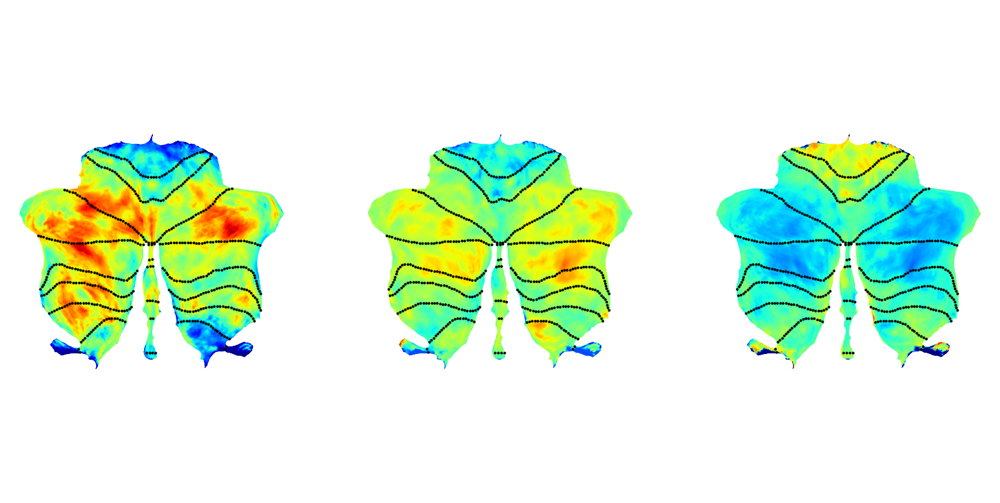

In [13]:
plt.figure(figsize=(20, 10))
plot_multi_flat(vars_rest_voxel.T, 'MNISymC2',
                   grid=(1, 3),
                   cmap = 'jet',
                   dtype='func',
                   colorbar=False)

<Axes: >

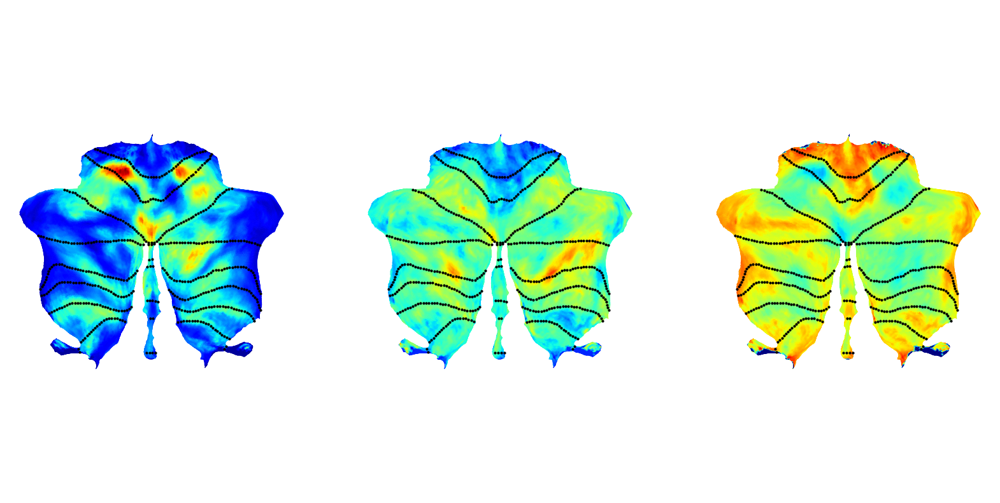

In [14]:
plt.figure(figsize=(20, 10))
plot_multi_flat(vars_task_voxel.T, 'MNISymC2',
                   grid=(1, 3),
                   cmap = 'jet',
                   dtype='func',
                   colorbar=False)

# Plot average correlation with rest back on fs32k

In [15]:
# Get winner-take-all mapping of cerebellar voxels from Sym32 atlas
export_dir = paths.set_export_dir(base_dir)
_, cmap, labels = nt.read_lut(export_dir + 'NettekovenSym32.lut')
regions = suit_atlas.read_data(export_dir + 'NettekovenSym32_space-MNISymC2_dseg.nii')


# Plot for each voxel, which network they correlate with the most and the least

In [16]:
# Get average correlation value of each voxel 
correlations = np.nanmean(np.nanmean(data_reshaped_rest, axis=0), axis=0)
activations = np.nanmean(np.nanmean(data_reshaped_task, axis=0), axis=0)

# Get average value of each region
indicator_matrix = pcm.indicator(regions)
correlations_avg = correlations @ indicator_matrix
activations_avg = activations @ indicator_matrix


In [49]:
# Load the cortical networks
net = nb.load(mdtb_dataset.base_dir +
                f'/../targets/Net69_space-fs32k.dscalar.nii')
# Multiply the cortical networks with the correlation values
cortical_map = net.get_fdata().T @ correlations_avg

In [56]:
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
cortical_map_avg = np.nanmean(cortical_map, axis=1)
cortical_map_avg = cortical_map_avg[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(cortical_map_avg)
cortical_map_surf = nt.surf_from_cifti(cifti_img)


In [40]:
# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='plotly',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)


    # setting up cameras to get a better view of the hand area in the lateral view
    # rotate to get a better view of M1 only on lateral view
    camera_params = []
    camera_params.append(dict( #left hemi
        center=dict(x=0,y=0,z=0),
        eye=dict(x=-1.5, y=0,z=0.9),
        up=dict(x=0,y=0,z=1),
    ))
    camera_params.append(dict( # right hemi
        center=dict(x=0,y=0,z=0),
        eye=dict(x=1.5, y=0,z=0.9),
        up=dict(x=0,y=0,z=1),
    ))
    hemis = ["L", "R"]
    if view == "lateral":
        ax[h].update_layout(scene_camera=camera_params[h])
    ax[h].show()


/Users/callithrix/code/Python/Functional_Fusion/env/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning:

vmin cannot be chosen when cmap is symmetric



# Plot correlations for specific regions

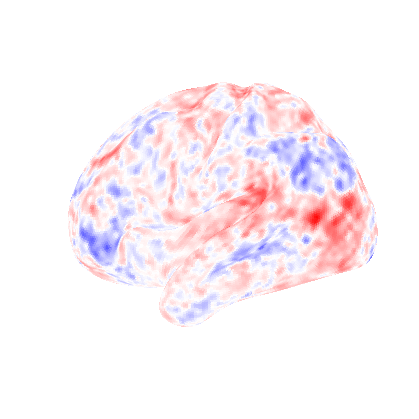

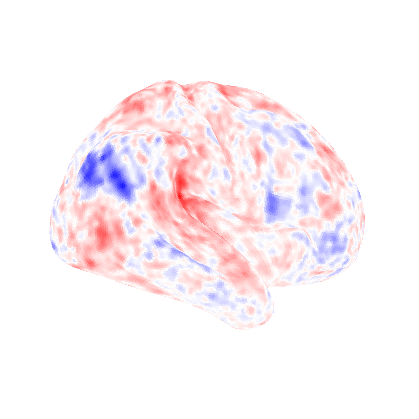

In [59]:
region='M3L'
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
plot_data = cortical_map[:,labels.index(region)-1]
plot_data = plot_data[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(plot_data)
cortical_map_surf = nt.surf_from_cifti(cifti_img)

# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='matplotlib',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)


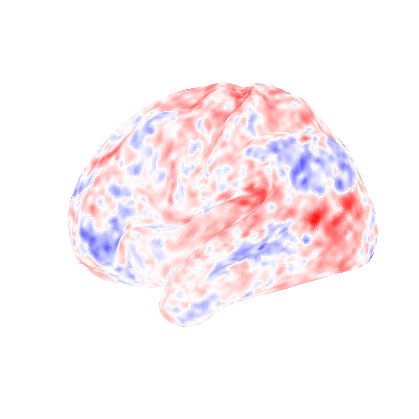

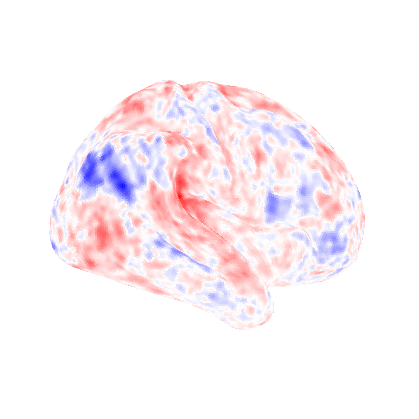

In [60]:
region='M3R'
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
plot_data = cortical_map[:,labels.index(region)-1]
plot_data = plot_data[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(plot_data)
cortical_map_surf = nt.surf_from_cifti(cifti_img)

# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='matplotlib',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)


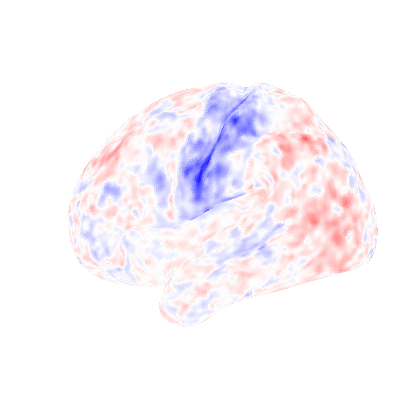

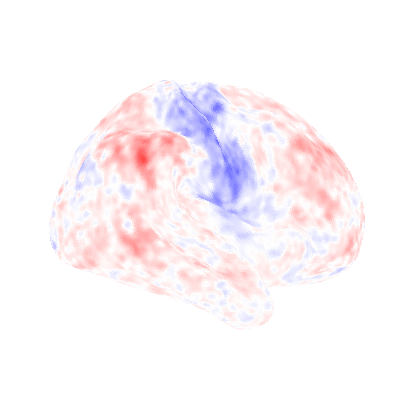

In [61]:
region='S1L'
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
plot_data = cortical_map[:,labels.index(region)-1]
plot_data = plot_data[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(plot_data)
cortical_map_surf = nt.surf_from_cifti(cifti_img)

# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='matplotlib',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)


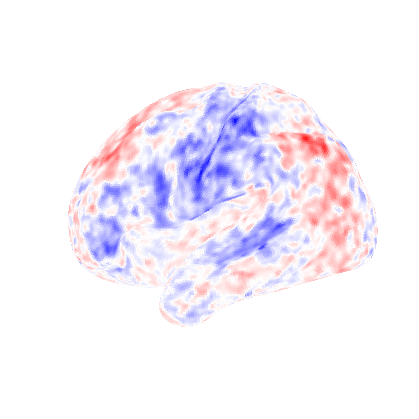

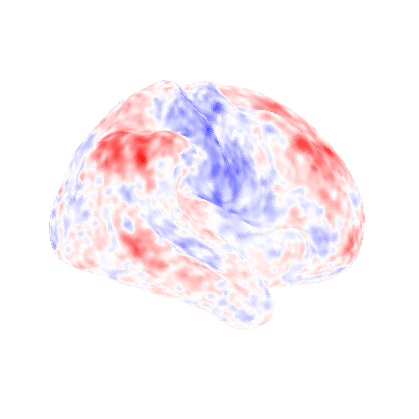

In [62]:
region='S4L'
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
plot_data = cortical_map[:,labels.index(region)-1]
plot_data = plot_data[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(plot_data)
cortical_map_surf = nt.surf_from_cifti(cifti_img)

# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='matplotlib',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)


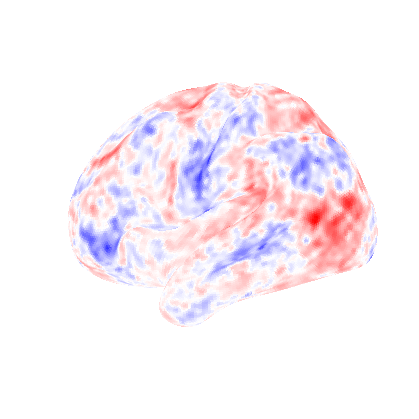

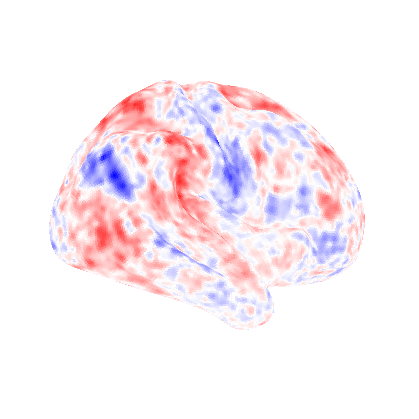

In [63]:
region='S5L'
# Project average to surace map
atlas_fs, _ = am.get_atlas("fs32k", atlas_dir)
plot_data = cortical_map[:,labels.index(region)-1]
plot_data = plot_data[:, np.newaxis].T
cifti_img = atlas_fs.data_to_cifti(plot_data)
cortical_map_surf = nt.surf_from_cifti(cifti_img)

# Plot the cortical map
view = "lateral"
cmap = "bwr"
colorbar = False
surfs = [atlas_dir + f"/tpl-fs32k/tpl-fs32k_hemi-{hemi}_inflated.surf.gii" for hemi in ['L', 'R']]
ax = []
for h, hemi in enumerate(['left', 'right']):
    fig = plotting.plot_surf_stat_map(
                                    surfs[h], cortical_map_surf[h], hemi=hemi,
                                    # title='Surface left hemisphere',
                                    colorbar=colorbar, 
                                    view = view,
                                    cmap=cmap,
                                    engine='matplotlib',
                                    symmetric_cbar = True,
                                )
    ax.append(fig.figure)
